In [1]:
#import module
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
import os
import tqdm
import random
from keras.preprocessing.image import load_img
warnings.filterwarnings('ignore')

In [2]:
import os
input_path = []
label = []
base_path='D:/Projects/kagglecatsdogs/PetImages'

for class_name in os.listdir(base_path): #loop through all sub folder: pet img, each sub folder corresponding to 1 class: dog or cat
    for path in os.listdir(os.path.join(base_path, class_name)): #loop 
        if class_name == 'Cat':
            label.append(0)
        else:
            label.append(1)
        input_path.append(os.path.join(base_path, class_name, path))
print(input_path[0], label[0])

D:/Projects/kagglecatsdogs/PetImages\Cat\0.jpg 0


In [3]:
df = pd.DataFrame()
df['images'] = input_path
df['label'] = label
df = df.sample(frac=1).reset_index(drop=True) #shuffle random using sample to take a part from Dtframe with frac =1 and show 5 first rows
df.head()

,images,label
0,D:/Projects/kagglecatsdogs/PetImages\Dog\3934.jpg,1
1,D:/Projects/kagglecatsdogs/PetImages\Cat\660.jpg,0
2,D:/Projects/kagglecatsdogs/PetImages\Dog\9826.jpg,1
3,D:/Projects/kagglecatsdogs/PetImages\Dog\10765...,1
4,D:/Projects/kagglecatsdogs/PetImages\Dog\7321.jpg,1


In [4]:
for i in df['images']:
    if '.jpg' not in i:
        print(i)
        

In [5]:
#using Pillow, 1 create blank list contains image path that cannot be opened, if there is any error in opening process, program turn into except block
import PIL
l = []
for image in df['images']:
    try:
        img = PIL.Image.open(image)
    except:
        l.append(image)

In [6]:
df = df[df['images']!='PetImages/Dog/Thumbs.db']
df = df[df['images']!='PetImages/Cat/Thumbs.db']
df = df[df['images']!='PetImages/Cat/666.jpg']
df = df[df['images']!='PetImages/Dog/11702.jpg']
len(df)
#delete and check

24998

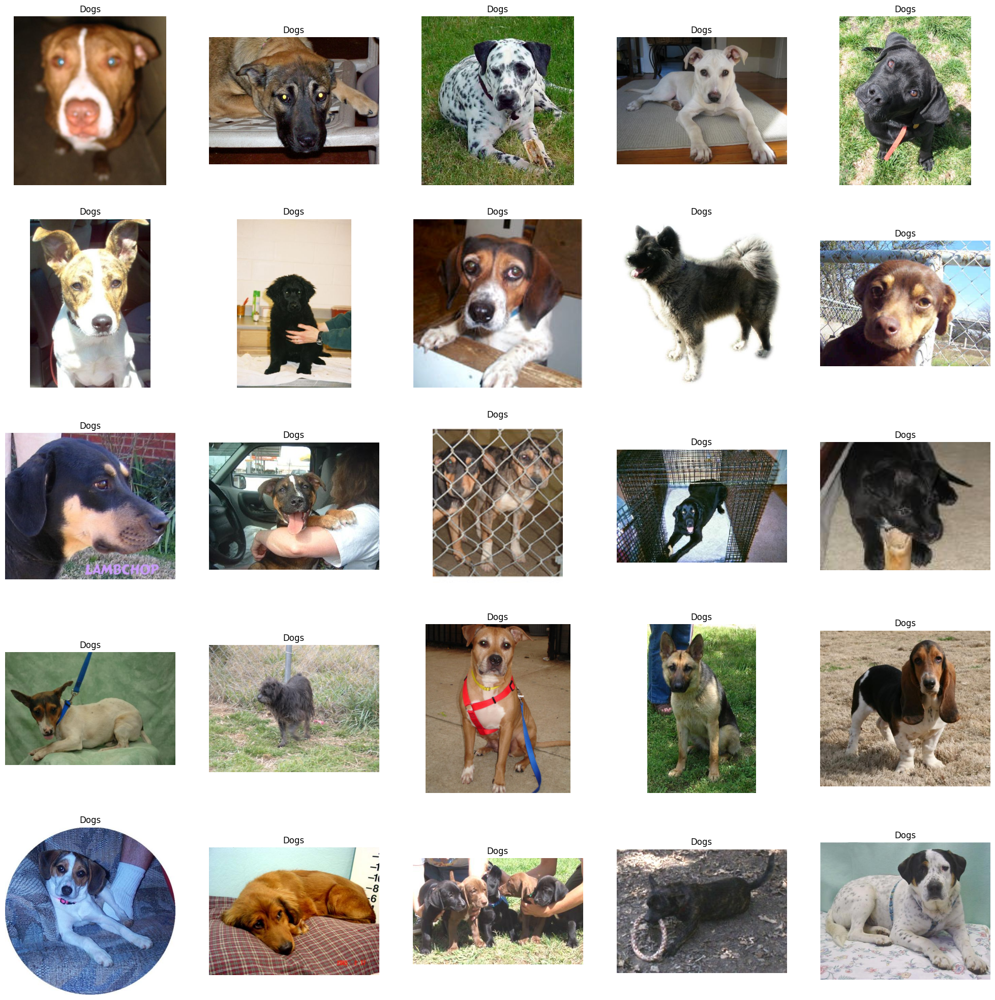

In [7]:
# to display grid of images
plt.figure(figsize=(25,25))
temp = df[df['label']==1]['images']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Dogs')
    plt.axis('off')

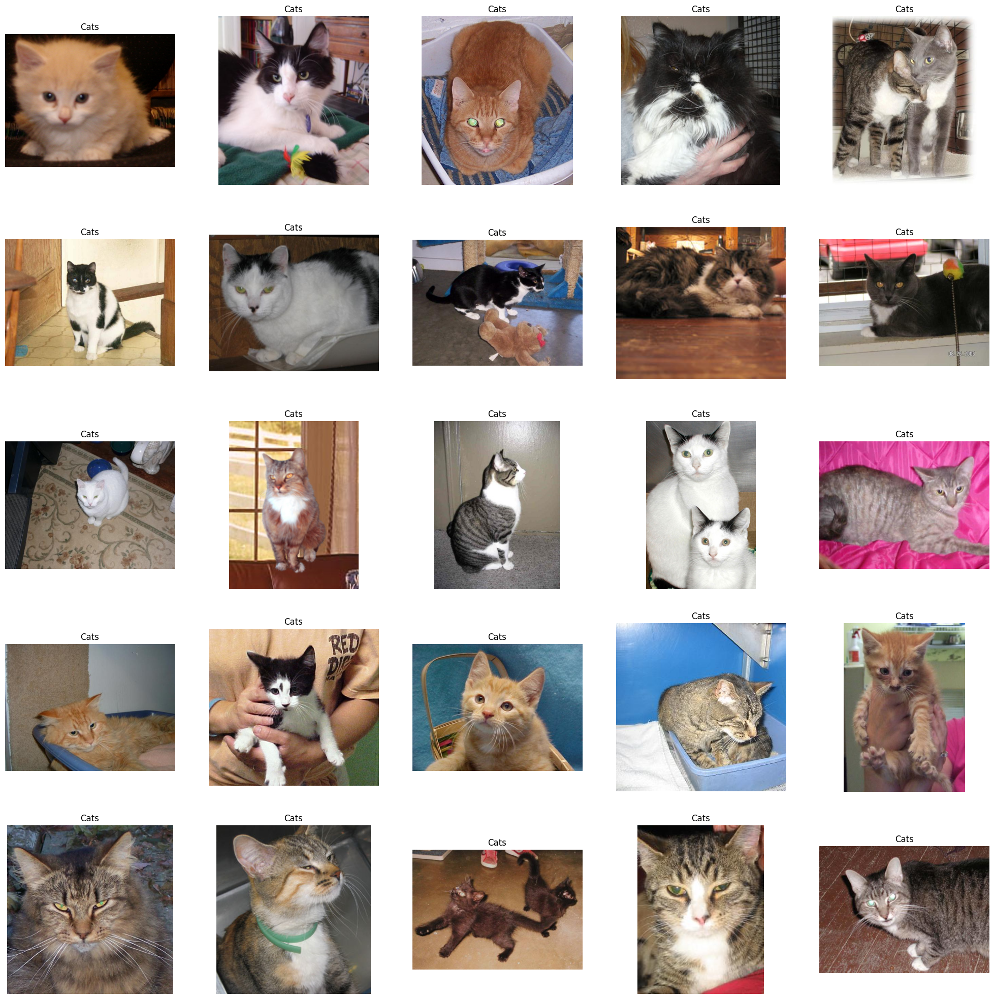

In [8]:
# to display grid of images
plt.figure(figsize=(25,25))
temp = df[df['label']==0]['images']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Cats')
    plt.axis('off')

In [9]:
pip install seaborn


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.3.1 -> 24.0
[notice] To update, run: C:\Users\MSI\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


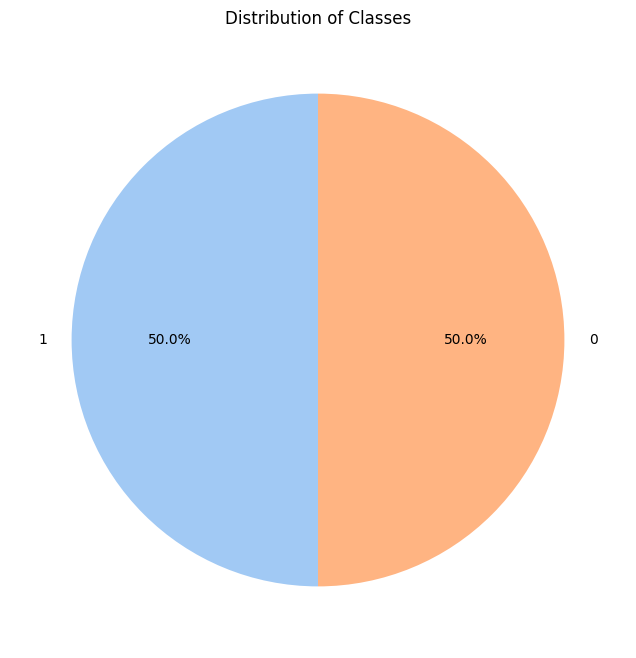

In [9]:
import seaborn as sns
import matplotlib.pyplot as plt

# Count the occurrences of each class
class_counts = df['label'].value_counts()

# Create a pie chart
plt.figure(figsize=(8, 8))
plt.pie(class_counts, labels=class_counts.index, autopct='%1.1f%%', startangle=90, colors=sns.color_palette('pastel'))
plt.title('Distribution of Classes')
plt.show()


In [10]:
#change type from label to string
df['label'] = df['label'].astype('str')

In [11]:
df.head()

,images,label
0,D:/Projects/kagglecatsdogs/PetImages\Dog\3934.jpg,1
1,D:/Projects/kagglecatsdogs/PetImages\Cat\660.jpg,0
2,D:/Projects/kagglecatsdogs/PetImages\Dog\9826.jpg,1
3,D:/Projects/kagglecatsdogs/PetImages\Dog\10765...,1
4,D:/Projects/kagglecatsdogs/PetImages\Dog\7321.jpg,1


In [12]:
# input split
#20% = 5k of 25k
from sklearn.model_selection import train_test_split
train, test = train_test_split(df, test_size=0.2, random_state=42)

In [14]:
#Using ImageDataGenerator from Keras to generate data visualization objects for training (train_generator) and testing (val_generator) 
# with some parameters like rescale, rotation, shear

In [ ]:
train_generator = ImageDataGenerator(
    rescale = 1./255,
    rotation_range = 45,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range = 0.2,
    zoom_range = 0.3,
    horizontal_flip = True,
    vertical_flip = True,
    fill_mode = 'nearest',
    brightness_range=[0.7,1.3]
)

ImportError: cannot import name 'ImageDataGenerator' from 'keras.preprocessing.image' (C:\Users\MSI\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\api\preprocessing\image\__init__.py)

In [16]:
#GENERATE CNN MODEL WITH KERAS_Conv2D(16, (3,3))-Layers Convolutional with 16 filters size 3x3, 
# ReLU activation function, input shape 128x128 with RGB color

In [ ]:
from keras import Sequential
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense,Dropout

model = Sequential([
    Conv2D(32, (3,3), activation='relu', input_shape=(128,128,3)),
    MaxPool2D((2,2)),
    Conv2D(64, (3,3), activation='relu'),
    MaxPool2D((2,2)),
    Conv2D(128, (3,3), activation='relu'),
    MaxPool2D((2,2)),
    Conv2D(128, (3,3), activation='relu'),
    MaxPool2D((2,2)),
    Flatten(),
    Dense(512, activation='relu'),
    BatchNormalization(),
    Dropout(0.5),
    Dense(256, activation='relu'), 
    Dropout(0.3),
    Dense(1, activation='sigmoid')
])

In [28]:
#optimizer='adam': Select optimization algorithm as Adam. Adam is a popular optimization algorithm used to adjust model weights during training
from keras.optimizers import Adam
optimizer = Adam(lr=0.001)
model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 126, 126, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 63, 63, 16)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 61, 61, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 30, 30, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 28, 28, 64)        18496     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 14, 14, 64)        0

In [19]:
#train 8 times
history = model.fit(train_iterator, epochs=8, validation_data=val_iterator)

Epoch 1/8



625/625 [==============================] - 129s 203ms/step - loss: 0.6188 - accuracy: 0.6545 - val_loss: 0.5480 - val_accuracy: 0.7132
Epoch 2/8
625/625 [==============================] - 123s 197ms/step - loss: 0.5350 - accuracy: 0.7294 - val_loss: 0.4897 - val_accuracy: 0.7584
Epoch 3/8
625/625 [==============================] - 121s 193ms/step - loss: 0.4954 - accuracy: 0.7605 - val_loss: 0.4820 - val_accuracy: 0.7708
Epoch 4/8
625/625 [==============================] - 122s 194ms/step - loss: 0.4576 - accuracy: 0.7812 - val_loss: 0.4284 - val_accuracy: 0.7960
Epoch 5/8
625/625 [==============================] - 121s 193ms/step - loss: 0.4351 - accuracy: 0.7976 - val_loss: 0.4039 - val_accuracy: 0.8172
Epoch 6/8
625/625 [==============================] - 121s 194ms/step - loss: 0.4176 - accuracy: 0.8083 - val_loss: 0.3911 - val_accuracy: 0.8210
Epoch 7/8
625/625 [==============================] - 121s 194ms/step - loss: 0.3941 - accuracy: 0.8234 - val_loss: 0.3585 - val_accuracy: 0.

In [20]:
import pickle

In [21]:
pickle.dump(model, open('model_1904.pkl', 'wb'))

In [22]:
model = pickle.load(open('model_1904.pkl', 'rb'))

In [23]:
#check the accuracy of the model

# Evaluate the model on the validation set
eval_result = model.evaluate(val_iterator)
# Print the accuracy
accuracy = eval_result[1]
print(f'Validation Accuracy: {accuracy * 100:.2f}%')

# Evaluate the model on the training set
train_eval_result = model.evaluate(train_iterator)
train_accuracy = train_eval_result[1]
# Print the accuracy
print(f'Training Accuracy: {train_accuracy * 100:.2f}%')





10/10 [==============================] - 8s 802ms/step - loss: 0.3521 - accuracy: 0.8382
Validation Accuracy: 83.82%
625/625 [==============================] - 76s 121ms/step - loss: 0.3442 - accuracy: 0.8517
Training Accuracy: 85.17%


In [24]:
from keras.preprocessing.image import load_img
import numpy as np


In [25]:

image_path = "testD.jpg" # path of the image
img = load_img(image_path, target_size=(128, 128))
img = np.array(img)
img = img / 255.0 # normalize the image
img = img.reshape(1, 128, 128, 3) # reshape for prediction
pred = model.predict(img)
if pred[0] > 0.5:
    label = 'Dog'
else:
    label = 'Cat'
print(label)

1/1 [==============================] - 0s 114ms/step
Dog


In [26]:
#check if it is the img or not
from PIL import Image
import io

l = []

for image_path in df['images']:
    try:
        # Open image using PIL
        img = Image.open(image_path)
    except (PIL.UnidentifiedImageError, OSError) as e:
        # Handle the exception and print an error message
        print(f"Error opening image {image_path}: {e}")
        l.append(image_path)

# Print the list of problematic images
print("Problematic images:", l)


Problematic images: []
